<a href="https://colab.research.google.com/github/Shritant/AI_ResearchPaper/blob/main/multi_viewGrasping.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install kaggle
from google.colab import files
files.upload() #upload kaggle.json
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json


In [ ]:
!kaggle datasets download -d shritanthirunagari/multi-view-cups-grasping-dataset

Dataset URL: https://www.kaggle.com/datasets/shritanthirunagari/multi-view-cups-grasping-dataset
License(s): CC0-1.0
 99% 709M/717M [00:02<00:00, 239MB/s]
100% 717M/717M [00:02<00:00, 316MB/s]


In [ ]:
!ls -la ~/.kaggle

total 16
drwxr-xr-x 2 root root 4096 Mar 14 21:42 .
drwx------ 1 root root 4096 Mar 14 21:42 ..
-rw------- 1 root root   87 Mar 14 21:42 kaggle.json


In [ ]:
!cat ~/.kaggle/kaggle.json

{
	"username": "shritanthirunagari", 
	"key": "KGAT_ad80c7bdbcdd3c9fefe7c69ddefce7ab"
}

In [ ]:
!unzip -q multi-view-cups-grasping-dataset.zip -d /content/cornell_grasp
!ls -la /content/cornell_grasp | head

total 12
drwxr-xr-x 3 root root 4096 Mar 14 21:42 .
drwxr-xr-x 1 root root 4096 Mar 14 21:42 ..
drwxr-xr-x 2 root root 4096 Mar 14 21:42 Cups_Grasping_Dataset


In [ ]:
import pandas as pd
import numpy as np
import os,re,random
from pathlib import Path

In [ ]:
root = Path("/content/cornell_grasp/Cups_Grasping_Dataset")
color_files = sorted(root.rglob("*_color.png"))
print("\n", color_files[:3])


 [PosixPath('/content/cornell_grasp/Cups_Grasping_Dataset/GLASS_01_head_color.png'), PosixPath('/content/cornell_grasp/Cups_Grasping_Dataset/GLASS_01_side_color.png'), PosixPath('/content/cornell_grasp/Cups_Grasping_Dataset/GLASS_01_top_color.png')]


In [ ]:

pattern = re.compile(r"(GLASS|MUG|TEACUP)_\d+_(top|side|head)_color\.png$", re.IGNORECASE)
rows = []
for i in color_files:
  p = pattern.search(i.name)
  if p is None:
      print("Filename not matched:", i.name)
      continue

  label = p.group(2).lower()
  cup_type = p.group(1).lower()
  rows.append({"path":str(i),"cup_type":cup_type,"label":label,"file_name":i.name})
df = pd.DataFrame(rows)
df.head()

,path,cup_type,label,file_name
0,/content/cornell_grasp/Cups_Grasping_Dataset/G...,glass,head,GLASS_01_head_color.png
1,/content/cornell_grasp/Cups_Grasping_Dataset/G...,glass,side,GLASS_01_side_color.png
2,/content/cornell_grasp/Cups_Grasping_Dataset/G...,glass,top,GLASS_01_top_color.png
3,/content/cornell_grasp/Cups_Grasping_Dataset/G...,glass,head,GLASS_02_head_color.png
4,/content/cornell_grasp/Cups_Grasping_Dataset/G...,glass,side,GLASS_02_side_color.png


In [ ]:
len(df)

90

# Head, Side, and Top Classification

In [ ]:
df["label"].value_counts()

,count
label,
head,30
side,30
top,30


In [ ]:
from sklearn.model_selection import train_test_split
train_df, testval_df = train_test_split(df,test_size=0.3,stratify=df["label"],random_state=1)
test_df, val_df = train_test_split(testval_df,test_size=0.5,stratify=testval_df["label"],random_state=1)

In [ ]:
import shutil
from tqdm import tqdm

OUT = Path("/content/data_split")

def copy_split(split_df, split_name):
    for label in split_df["label"].unique():
        (OUT / split_name / label).mkdir(parents=True, exist_ok=True)
    for _, row in tqdm(split_df.iterrows(), total=len(split_df), desc=f"Copy {split_name}"):
        src = Path(row["path"])
        dst = OUT / split_name / row["label"] / src.name
        if not dst.exists():
            shutil.copy2(src, dst)

if OUT.exists():
    shutil.rmtree(OUT)

copy_split(train_df, "train")
copy_split(val_df, "val")
copy_split(test_df, "test")

!find /content/data_split -maxdepth 2 -type d -print
!find /content/data_split/train -type f | head

Copy test: 100%|██████████| 13/13 [00:01<00:00, 10.43it/s]


/content/data_split
/content/data_split/val
/content/data_split/val/side
/content/data_split/val/head
/content/data_split/val/top
/content/data_split/train
/content/data_split/train/side
/content/data_split/train/head
/content/data_split/train/top
/content/data_split/test
/content/data_split/test/side
/content/data_split/test/head
/content/data_split/test/top
/content/data_split/train/side/GLASS_03_side_color.png
/content/data_split/train/side/GLASS_08_side_color.png
/content/data_split/train/side/MUG_09_side_color.png
/content/data_split/train/side/TEACUP_06_side_color.png
/content/data_split/train/side/GLASS_04_side_color.png
/content/data_split/train/side/TEACUP_07_side_color.png
/content/data_split/train/side/GLASS_07_side_color.png
/content/data_split/train/side/TEACUP_10_side_color.png
/content/data_split/train/side/GLASS_09_side_color.png
/content/data_split/train/side/TEACUP_02_side_color.png


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
imageSize = (32,32)
batchSize = 32

train_ds = tf.keras.utils.image_dataset_from_directory(
    OUT / "train",
    image_size = imageSize,
    batch_size = batchSize,
    label_mode = "int"
)
val_ds = tf.keras.utils.image_dataset_from_directory(
    OUT / "val",
    image_size = imageSize,
    batch_size = batchSize,
    label_mode = "int"
)
test_ds = tf.keras.utils.image_dataset_from_directory(
    OUT / "test",
    image_size = imageSize,
    batch_size = batchSize,
    label_mode = "int"
)
class_names = train_ds.class_names
num_classes = len(train_ds.class_names)
print("classes:",class_names,num_classes)

Found 63 files belonging to 3 classes.
Found 14 files belonging to 3 classes.
Found 13 files belonging to 3 classes.
classes: ['head', 'side', 'top'] 3


In [ ]:
data_root = "cornell_grasp/Cups_Grasping_Dataset"
seed = 42
#my_list = []
#for my_list
model = tf.keras.Sequential([
    layers.Input(shape = (*imageSize, 3)),
    layers.Rescaling(1/255),
    layers.Conv2D(32, 3, activation="relu"),
    layers.MaxPooling2D(),

    layers.Conv2D(64, 3, activation="relu"),
    layers.MaxPooling2D(),

    layers.Conv2D(128, 3, activation="relu"),
    layers.MaxPooling2D(),

    layers.GlobalAveragePooling2D(),

    layers.Dense(128, activation="relu"),
    layers.Dropout(0.3),
    layers.Dense(num_classes, activation="softmax" if num_classes > 2 else "sigmoid"),
])
loss = "sparse_categorical_crossentropy" if num_classes > 2 else "binary_crossentropy"
model.compile(optimizer="adam", loss=loss, metrics=["accuracy"])
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 15, 15, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 13, 13, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 4, 4, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 2, 2, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 110,147 (430.26 KB)

 Trainable params: 110,147 (430.26 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:

y_true = np.concatenate([y.numpy() for _, y in test_ds], axis=0)
y_prob = model.predict(test_ds)
if y_prob.shape[1] > 1:
    y_pred = np.argmax(y_prob, axis=1)
else:
    y_pred = (y_prob.ravel() > 0.5).astype(int)

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


In [ ]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_true, y_pred)
print(cm)

[[5 0 0]
 [4 0 0]
 [4 0 0]]


In [ ]:
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.38      1.00      0.56         5
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00         4

    accuracy                           0.38        13
   macro avg       0.13      0.33      0.19        13
weighted avg       0.15      0.38      0.21        13



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


# Baseline Models

In [ ]:
df.head()

,path,cup_type,label,file_name
0,/content/cornell_grasp/Cups_Grasping_Dataset/G...,glass,head,GLASS_01_head_color.png
1,/content/cornell_grasp/Cups_Grasping_Dataset/G...,glass,side,GLASS_01_side_color.png
2,/content/cornell_grasp/Cups_Grasping_Dataset/G...,glass,top,GLASS_01_top_color.png
3,/content/cornell_grasp/Cups_Grasping_Dataset/G...,glass,head,GLASS_02_head_color.png
4,/content/cornell_grasp/Cups_Grasping_Dataset/G...,glass,side,GLASS_02_side_color.png


In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df["y"] = le.fit_transform(df["label"])
df.head()

,path,cup_type,label,file_name,y
0,/content/cornell_grasp/Cups_Grasping_Dataset/G...,glass,head,GLASS_01_head_color.png,0
1,/content/cornell_grasp/Cups_Grasping_Dataset/G...,glass,side,GLASS_01_side_color.png,1
2,/content/cornell_grasp/Cups_Grasping_Dataset/G...,glass,top,GLASS_01_top_color.png,2
3,/content/cornell_grasp/Cups_Grasping_Dataset/G...,glass,head,GLASS_02_head_color.png,0
4,/content/cornell_grasp/Cups_Grasping_Dataset/G...,glass,side,GLASS_02_side_color.png,1


In [ ]:
print(le.classes_)

['head' 'side' 'top']


In [ ]:
import cv2
imageSize = (64,64)
X = []
y = []
for _, row in tqdm(df.iterrows(),total=len(df)):
  img = cv2.imread(row["path"])
  if img is None:
    continue
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = cv2.resize(img, imageSize)
  X.append(img.flatten())
  y.append(row["y"])
X = np.array(X, dtype=np.float32)
y = np.array(y)
print(X.shape, y.shape)

100%|██████████| 90/90 [00:35<00:00,  2.50it/s]

(90, 12288) (90,)


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report
logistic_model_a = LogisticRegression()
logistic_model_a.fit(X_train, y_train)
y_pred = logistic_model_a.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
print(cm)

[[5 0 1]
 [1 5 0]
 [0 0 6]]


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.83      0.83      0.83         6
           1       1.00      0.83      0.91         6
           2       0.86      1.00      0.92         6

    accuracy                           0.89        18
   macro avg       0.90      0.89      0.89        18
weighted avg       0.90      0.89      0.89        18



# Glass, Mug, and Teacup Classification

In [ ]:
df["cup_type"].value_counts()

,count
cup_type,
glass,30
mug,30
teacup,30


In [ ]:
OUT = Path("/content/data_split")

def copy_split(split_df, split_name):
    for cup_type in split_df["cup_type"].unique():
        (OUT / split_name / cup_type).mkdir(parents=True, exist_ok=True)
    for _, row in tqdm(split_df.iterrows(), total=len(split_df), desc=f"Copy {split_name}"):
        src = Path(row["path"])
        dst = OUT / split_name / row["cup_type"] / src.name
        if not dst.exists():
            shutil.copy2(src, dst)

if OUT.exists():
    shutil.rmtree(OUT)

copy_split(train_df, "train")
copy_split(val_df, "val")
copy_split(test_df, "test")

!find /content/data_split -maxdepth 2 -type d -print
!find /content/data_split/train -type f | head

Copy test: 100%|██████████| 13/13 [00:02<00:00,  5.48it/s]

/content/data_split
/content/data_split/val
/content/data_split/val/mug
/content/data_split/val/teacup
/content/data_split/val/glass
/content/data_split/train
/content/data_split/train/mug
/content/data_split/train/teacup
/content/data_split/train/glass
/content/data_split/test
/content/data_split/test/mug
/content/data_split/test/teacup
/content/data_split/test/glass


/content/data_split/train/mug/MUG_01_top_color.png
/content/data_split/train/mug/MUG_08_head_color.png
/content/data_split/train/mug/MUG_10_head_color.png
/content/data_split/train/mug/MUG_09_head_color.png
/content/data_split/train/mug/MUG_09_side_color.png
/content/data_split/train/mug/MUG_05_top_color.png
/content/data_split/train/mug/MUG_07_head_color.png
/content/data_split/train/mug/MUG_04_head_color.png
/content/data_split/train/mug/MUG_06_top_color.png
/content/data_split/train/mug/MUG_03_side_color.png


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
imageSize = (32,32)
batchSize = 32

train_ds = tf.keras.utils.image_dataset_from_directory(
    OUT / "train",
    image_size = imageSize,
    batch_size = batchSize,
    label_mode = "int"
)
val_ds = tf.keras.utils.image_dataset_from_directory(
    OUT / "val",
    image_size = imageSize,
    batch_size = batchSize,
    label_mode = "int"
)
test_ds = tf.keras.utils.image_dataset_from_directory(
    OUT / "test",
    image_size = imageSize,
    batch_size = batchSize,
    label_mode = "int"
)
class_names = train_ds.class_names
num_classes = len(train_ds.class_names)
print("classes:",class_names,num_classes)

Found 63 files belonging to 3 classes.
Found 14 files belonging to 3 classes.
Found 13 files belonging to 3 classes.
classes: ['glass', 'mug', 'teacup'] 3


In [ ]:
data_root = "cornell_grasp/Cups_Grasping_Dataset"
seed = 42
model = tf.keras.Sequential([
    layers.Input(shape = (*imageSize, 3)),
    layers.Rescaling(1/255),
    layers.Conv2D(32, 3, activation="relu"),
    layers.MaxPooling2D(),

    layers.Conv2D(64, 3, activation="relu"),
    layers.MaxPooling2D(),

    layers.Conv2D(128, 3, activation="relu"),
    layers.MaxPooling2D(),

    layers.GlobalAveragePooling2D(),

    layers.Dense(128, activation="relu"),
    layers.Dropout(0.3),
    layers.Dense(num_classes, activation="softmax" if num_classes > 2 else "sigmoid"),
])
loss = "sparse_categorical_crossentropy" if num_classes > 2 else "binary_crossentropy"
model.compile(optimizer="adam", loss=loss, metrics=["accuracy"])
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_1 (Rescaling)         │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 15, 15, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 13, 13, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 4, 4, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 2, 2, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 3)              │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 110,147 (430.26 KB)

 Trainable params: 110,147 (430.26 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
y_true = np.concatenate([y.numpy() for _, y in test_ds], axis=0)
y_prob = model.predict(test_ds)
if y_prob.shape[1] > 1:
    y_pred = np.argmax(y_prob, axis=1)
else:
    y_pred = (y_prob.ravel() > 0.5).astype(int)

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


In [ ]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_true, y_pred)
print(cm)

[[4 0 0]
 [6 0 0]
 [3 0 0]]


In [ ]:
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.31      1.00      0.47         4
           1       0.00      0.00      0.00         6
           2       0.00      0.00      0.00         3

    accuracy                           0.31        13
   macro avg       0.10      0.33      0.16        13
weighted avg       0.09      0.31      0.14        13



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


# Baseline Model

In [ ]:
df.head()

,path,cup_type,label,file_name,y
0,/content/cornell_grasp/Cups_Grasping_Dataset/G...,glass,head,GLASS_01_head_color.png,0
1,/content/cornell_grasp/Cups_Grasping_Dataset/G...,glass,side,GLASS_01_side_color.png,1
2,/content/cornell_grasp/Cups_Grasping_Dataset/G...,glass,top,GLASS_01_top_color.png,2
3,/content/cornell_grasp/Cups_Grasping_Dataset/G...,glass,head,GLASS_02_head_color.png,0
4,/content/cornell_grasp/Cups_Grasping_Dataset/G...,glass,side,GLASS_02_side_color.png,1


In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df["y_t"] = le.fit_transform(df["cup_type"])
df.head()

,path,cup_type,label,file_name,y,y_t
0,/content/cornell_grasp/Cups_Grasping_Dataset/G...,glass,head,GLASS_01_head_color.png,0,0
1,/content/cornell_grasp/Cups_Grasping_Dataset/G...,glass,side,GLASS_01_side_color.png,1,0
2,/content/cornell_grasp/Cups_Grasping_Dataset/G...,glass,top,GLASS_01_top_color.png,2,0
3,/content/cornell_grasp/Cups_Grasping_Dataset/G...,glass,head,GLASS_02_head_color.png,0,0
4,/content/cornell_grasp/Cups_Grasping_Dataset/G...,glass,side,GLASS_02_side_color.png,1,0


In [ ]:
print(le.classes_)

['glass' 'mug' 'teacup']


In [ ]:
import cv2
imageSize = (64,64)
X = []
y = []
for _, row in tqdm(df.iterrows(),total=len(df)):
  img = cv2.imread(row["path"])
  if img is None:
    continue
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = cv2.resize(img, imageSize)
  X.append(img.flatten())
  y.append(row["y_t"])
X = np.array(X, dtype=np.float32)
y = np.array(y)
print(X.shape, y.shape)

100%|██████████| 90/90 [00:40<00:00,  2.23it/s]

(90, 12288) (90,)


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report
logistic_model = LogisticRegression()
logistic_model.fit(X_train, y_train)
y_pred = logistic_model.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
print(cm)

[[6 0 0]
 [0 6 0]
 [3 0 3]]


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.67      1.00      0.80         6
           1       1.00      1.00      1.00         6
           2       1.00      0.50      0.67         6

    accuracy                           0.83        18
   macro avg       0.89      0.83      0.82        18
weighted avg       0.89      0.83      0.82        18



# Grasp Score

In [ ]:
df["predicted cup type"] = logistic_model.predict(X)
df["predicted view"] = logistic_model_a.predict(X)

df["grasp_success"] = (df["predicted cup type"] == df["y_t"]).astype(int) * (df["predicted view"] == df["y"]).astype(int)


In [ ]:
df["grasp_success"].value_counts()

,count
grasp_success,
1,85
0,5


Bounding Box

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 48.9 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.

image 1/1 /content/cornell_grasp/Cups_Grasping_Dataset/TEACUP_06_head_color.png: 640x480 1 cup, 351.7ms
Speed: 4.2ms preprocess, 351.7ms inference, 40.6ms postprocess per image at shape (1, 3, 640, 480)


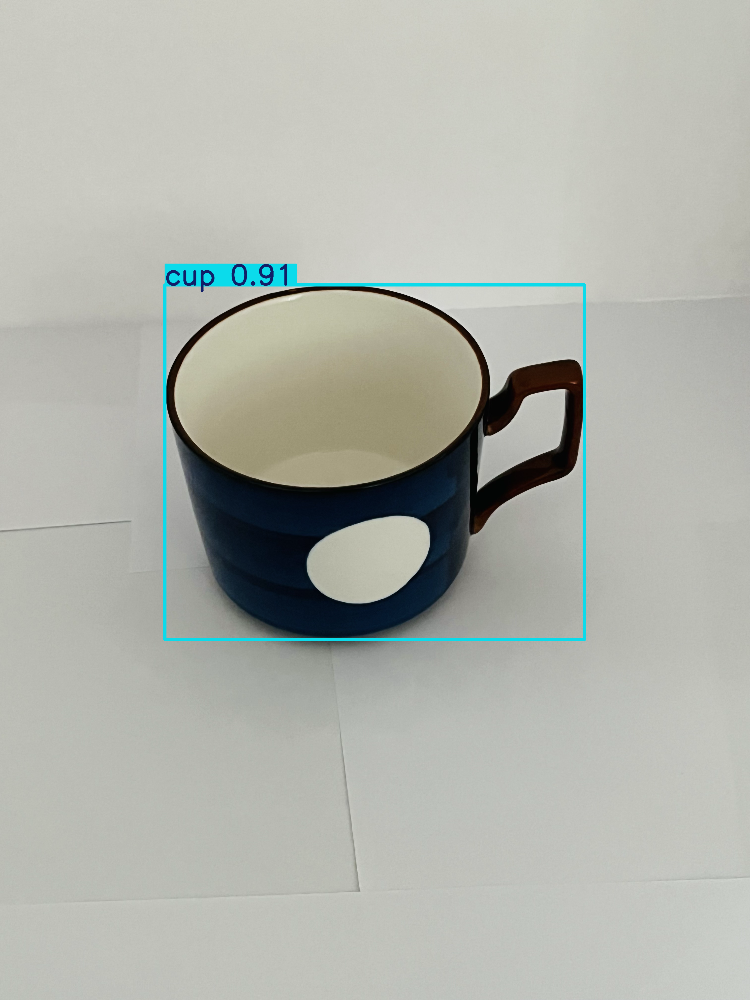

In [ ]:
!pip install ultralytics
from ultralytics import YOLO
model = YOLO("yolov8n.pt")
image = "/content/cornell_grasp/Cups_Grasping_Dataset/TEACUP_06_head_color.png"
results = model(image)
results[0].show()



In [ ]:
result = results[0]
boxes = result.boxes

for box in boxes:
    x1, y1, x2, y2 = box.xyxy[0]
    x_center = (x1 + x2) / 2
    y_center = (y1 + y2) / 2

    print(f"Grasp point (x, y): ({x_center.item()}, {y_center.item()})")


Grasp point (x, y): (1510.8956298828125, 1863.67333984375)
